In [1]:
def decode_tokens(example):
    idx = 1
    enc =[(x, tokenizer.encode(x, add_special_tokens=False)) for x in example.split()]

    desired_output = []

    for x, token in enc:
        tokenoutput = []
        for ids in token:
            tokenoutput.append(idx)
            idx +=1
        desired_output.append(tokenoutput)

    return desired_output

In [2]:
def get_attention_scores(
    sentence:str,
    attention,
    subj:int = 0,
    obj:int = 2,
    verb_b:int = 3,
    verb_e:int = 5
):
    words = decode_tokens(sentence)
    subj_word = words[subj]
    obj_word = words[obj]
    verb = [idx for x in words[verb_b:verb_e] for idx in x]

    subj_attention = attention[:,verb[0]:verb[-1]+1,subj_word[0]:subj_word[-1]+1].mean(axis=[1,2])
    obj_attention = attention[:,verb[0]:verb[-1]+1,obj_word[0]:obj_word[-1]+1].mean(axis=[1,2])

    return subj_attention, obj_attention

In [3]:
import pandas as pd
import torch
from tqdm.auto import tqdm
from statsmodels.stats.multitest import multipletests

from transformers import AutoModel, AutoTokenizer, AutoConfig, AutoModelForCausalLM

In [4]:
MODEL_NAME = 'ai-forever/ruGPT-3.5-13B'
model = AutoModelForCausalLM.from_pretrained(
    MODEL_NAME,
    device_map='cuda:0',
    load_in_8bit=True,
    offload_folder='./_tmp',
    max_memory={0: f'{int(torch.cuda.mem_get_info()[0] / 1024 ** 3) - 2}GB'},
    cache_dir="./.cache/huggingface",
    output_attentions=True
)
config = AutoConfig.from_pretrained(MODEL_NAME)
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME, use_fast=False)

/home/jovyan/.imgenv-competent-chaplygin-0/lib/python3.7/site-packages/scipy/special/orthogonal.py:81: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  from numpy import (exp, inf, pi, sqrt, floor, sin, cos, around, int,
You are loading your model in 8bit or 4bit but no linear modules were found in your model. this can happen for some architectures such as gpt2 that uses Conv1D instead of Linear layers. Please double check your model architecture, or submit an issue on github if you think this is a bug.


Loading checkpoint shards:   0%|          | 0/6 [00:00<?, ?it/s]

In [5]:
stimuli = pd.read_csv("stimuli (1).xlsx - Sl2018_JML.csv")

In [6]:
sentences = stimuli.Sentence.to_list()

In [7]:
data_loader = torch.utils.data.DataLoader(sentences, batch_size=4)

In [8]:
device = "cpu"

In [9]:
def return_batch_attention(sentences, attentions):
    subj_att_weights = torch.zeros(len(sentences), 40)
    obj_att_weights = torch.zeros(len(sentences), 40)
    for num, (sentence, attention) in enumerate(zip(sentences, attentions)):
        subj_W, obj_W = get_attention_scores(sentence, attention)
        subj_att_weights[num] = subj_W
        obj_att_weights[num] = obj_W
    return subj_att_weights, obj_att_weights

In [10]:
subj_predictions = []
obj_predictions = []
for sent_batch in tqdm(data_loader):
    enc = tokenizer(sent_batch, padding=True, truncation=True,
                max_length=512, return_tensors='pt')
    with torch.no_grad():
        enc = enc.to(device)
        output = model(**enc, return_dict=True)
        subj, obj = return_batch_attention(sent_batch, output["attentions"][-1])
        subj_predictions.append(subj)
        obj_predictions.append(obj)

  0%|          | 0/128 [00:00<?, ?it/s]

In [11]:
subj_attention = torch.cat(subj_predictions)
obj_attention = torch.cat(obj_predictions)

In [12]:
sss = stimuli.index[stimuli['Code'] == 'S_S-S'].tolist()
pss = stimuli.index[stimuli['Code'] == 'P_S-S'].tolist()
ssp = stimuli.index[stimuli['Code'] == 'S_S-P'].tolist()
sps = stimuli.index[stimuli['Code'] == 'S_P-S'].tolist()
pps = stimuli.index[stimuli['Code'] == 'P_P-S'].tolist()
spp = stimuli.index[stimuli['Code'] == 'S_P-P'].tolist()
ppp = stimuli.index[stimuli['Code'] == 'P_P-P'].tolist()
psp = stimuli.index[stimuli['Code'] == 'P_S-P'].tolist()

In [13]:
stimuli["subj_attention"] = subj_attention.tolist()
stimuli["obj_attention"] = obj_attention.tolist()

stimuli.to_csv(f"raw_results/results_{MODEL_NAME.split('/')[-1]}.csv")

Text(0.5, 1.0, 'P_P-S')

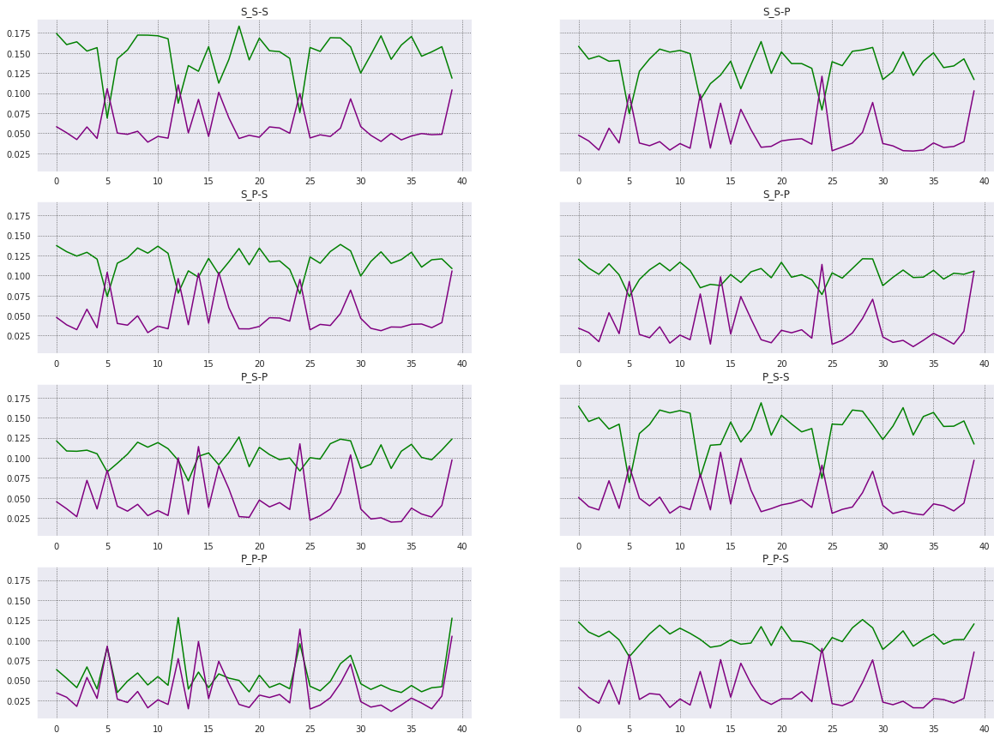

In [14]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("darkgrid", {"grid.color": ".3", "grid.linestyle": ":"})
sns.color_palette("mako", as_cmap=True)

fig, ax = plt.subplots(4, 2, figsize=(20, 15), sharey=True)

sns.lineplot(subj_attention[sss].mean(axis=0), ax=ax[0,0], color="green", legend="auto")
sns.lineplot(obj_attention[sss].mean(axis=0), ax=ax[0,0], color="purple", legend="auto")
ax[0,0].set_title('S_S-S')

sns.lineplot(subj_attention[ssp].mean(axis=0), ax=ax[0,1], color="green")
sns.lineplot(obj_attention[ssp].mean(axis=0), ax=ax[0,1], color="purple")
ax[0,1].set_title('S_S-P')

sns.lineplot(subj_attention[sps].mean(axis=0), ax=ax[1,0], color="green")
sns.lineplot(obj_attention[sps].mean(axis=0), ax=ax[1,0], color="purple")
ax[1,0].set_title('S_P-S')

sns.lineplot(subj_attention[spp].mean(axis=0), ax=ax[1,1], color="green")
sns.lineplot(obj_attention[spp].mean(axis=0), ax=ax[1,1], color="purple")
ax[1,1].set_title('S_P-P')

sns.lineplot(subj_attention[psp].mean(axis=0), ax=ax[2,0], color="green")
sns.lineplot(obj_attention[psp].mean(axis=0), ax=ax[2,0], color="purple")
ax[2,0].set_title('P_S-P')

sns.lineplot(subj_attention[pss].mean(axis=0), ax=ax[2,1], color="green")
sns.lineplot(obj_attention[pss].mean(axis=0), ax=ax[2,1], color="purple")
ax[2,1].set_title('P_S-S')

sns.lineplot(subj_attention[ppp].mean(axis=0), ax=ax[3,0], color="green")
sns.lineplot(obj_attention[spp].mean(axis=0), ax=ax[3,0], color="purple")
ax[3,0].set_title('P_P-P')

sns.lineplot(subj_attention[pps].mean(axis=0), ax=ax[3,1], color="green")
sns.lineplot(obj_attention[pps].mean(axis=0), ax=ax[3,1], color="purple")
ax[3,1].set_title('P_P-S')


In [15]:
from scipy.stats import ttest_rel
cases = {"S_S-S": sss,
                "S_P-S": sps,
                "S_S-P": ssp,
                "S_P-P": spp,
                "P_S-S": pss,
                "P_P-S": pps,
                "P_S-P": psp,
                "P_P-P": ppp}

Сравнение на разных условиях:

In [16]:
from itertools import combinations

Субъект:

In [17]:
pvals = []
names = []
for case_1, case_2 in combinations(cases.items(), 2):
    res = ttest_rel(subj_attention[case_1[1]].mean(0), subj_attention[case_2[1]].mean(0))
    pvals.append(res.pvalue)
    names.append(f"{case_1[0]} - {case_2[0]}")

In [18]:
pvals = multipletests(pvals, method="bonferroni")

In [19]:
import pandas as pd

subj_attention = pd.DataFrame({"comparison": names, "p-value": pvals[1], "significant": pvals[0]})
subj_attention.to_csv(f"{MODEL_NAME.split('/')[-1]}_subj_attention.csv")

Объект:

In [20]:
pvals = []
names = []

for case_1, case_2 in combinations(cases.items(), 2):
    res = ttest_rel(obj_attention[case_1[1]].mean(0), obj_attention[case_2[1]].mean(0))

    pvals.append(res.pvalue)
    names.append(f"{case_1[0]} - {case_2[0]}")

In [21]:
pvals = multipletests(pvals, method="bonferroni")
obj_attention = pd.DataFrame({"comparison": names, "p-value": pvals[1], "significant": pvals[0]})
obj_attention.to_csv(f"{MODEL_NAME.split('/')[-1]}_obj_attention.csv")

### Attention для одного предложения


In [23]:
sentence = sentences[0]

enc = tokenizer(sentence, padding=True, truncation=True,
                max_length=512, return_tensors='pt')
with torch.no_grad():
    enc = enc.to(device)
    output = model(**enc, return_dict=True)

In [24]:
from bertviz import model_view


attention = output["attentions"]
tokens = tokenizer.convert_ids_to_tokens(enc["input_ids"][0])  # Convert input ids to token strings
model_view(attention, tokens)  # Display model view

<IPython.core.display.Javascript object>

In [25]:
from bertviz import head_view
head_view(attention, tokens)

<IPython.core.display.Javascript object>